# Metodología - Avances 

## 22 Mayo 2019 
Se busca aumentar las características de cada entrenamiento en busca de idenfiticar tipos de entrenamientos 

### Carga de datos

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style('darkgrid')
from scipy import stats

/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
csv = 'actividadesCorredoresFull.csv'
df_actividad = pd.read_csv(csv)
print(df_actividad.keys())

csv = 'TORRENCIAL_STRAVA.csv'
df_lesion = pd.read_csv(csv, sep=';')
print(df_lesion.keys())

data = df_actividad.join(df_lesion.set_index('strava_id'), on='user_id')
data = data[data['distance'] > 0]
print(len(data))

data = data.dropna(subset=['Pregunta 1'])
print(len(data))



Index(['id', 'strava_id', 'start_date_local', 'average_speed', 'elapsed_time',
       'elev_low', 'elev_high', 'moving_time', 'max_speed', 'distance', 'name',
       'total_elevation_gain', 'user_id', 'id.1', 'password', 'last_login',
       'is_superuser', 'username', 'first_name', 'last_name', 'email',
       'is_staff', 'is_active', 'date_joined'],
      dtype='object')
Index(['strava_id', 'Unnamed: 1', 'Mail', 'Fecha de nacimiento', 'Sexo (F/M)',
       'Distancia', 'Ciudad', 'País', 'Estatura', 'Peso', 'Pregunta 1',
       'Pregunta 2 Mes', 'Pregunta 2 duración', 'Pregunta 2 localización',
       'Pregunta 2 causa', '3.1', '3.2'],
      dtype='object')
5298
4481


In [18]:
data = data[ data['Peso'] != 'PREGUNTAR']
print(len(data))

data = data.dropna(subset=['Peso'])
print(len(data))

data['Peso'] = pd.to_numeric(data["Peso"]) #data['Peso']

4311


In [13]:
data[['name', 'distance','elev_low', 'elev_high', 'total_elevation_gain', 'Peso']]
#

,name,distance,elev_low,elev_high,total_elevation_gain,Peso
0,Torrencial 2018,26118.8,12.0,642.1,1475.9,68
1,Carrera por la tarde,6868.0,14.1,80.6,132.4,68
2,Carrera por la mañana,26579.4,3.5,427.8,1174.7,68
3,Carrera por la tarde,10197.0,12.5,78.7,166.0,68
4,Carrera por la mañana,15008.5,3.5,330.2,641.5,68
5,Carrera por la tarde,9007.2,14.0,79.2,150.7,68
6,Carrera por la tarde,9360.5,14.0,78.6,164.2,68
7,Carrera a la hora del almuerzo,8440.9,-10.2,2.2,37.0,68
8,Carrera por la mañana,15042.7,3.2,329.7,640.6,68
9,Carrera por la tarde,9007.4,13.8,80.8,151.0,68


In [95]:
data = data[data['average_speed'] < data['max_speed']]
len(data)

4237

OBS: TOTAL_ELEVATION_GAIN es la suma de todos los tramos de ascenso 

### Variables 
- Energía cinética : 1/2 masa * velocidad2
- energia potencial: m*g*h -> masa * g * (total_elevation_gain)
- Distancia x Masa x Aceleración2 
- F = m*a -> m* ( vf - vi / t ) -> m* (vm - vp / tiempo (?) ) -> m* 2*d/t2


In [26]:
data['en_cinetica'] = data.apply(lambda x: (x['Peso']*(x['average_speed']**2))/2 , axis=1)
data['en_potencial'] = data.apply(lambda x: (x['Peso']*9.8*(x['total_elevation_gain'])) , axis=1)
data['fuerza'] = data.apply(lambda x: (x['Peso']*2*(x['distance'])/(x['elapsed_time']**2)) , axis=1)

In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import seaborn as sns
sns.set(style="ticks")

/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [33]:
data.keys()

Index(['id', 'strava_id', 'start_date_local', 'average_speed', 'elapsed_time',
       'elev_low', 'elev_high', 'moving_time', 'max_speed', 'distance', 'name',
       'total_elevation_gain', 'user_id', 'id.1', 'password', 'last_login',
       'is_superuser', 'username', 'first_name', 'last_name', 'email',
       'is_staff', 'is_active', 'date_joined', 'Unnamed: 1', 'Mail',
       'Fecha de nacimiento', 'Sexo (F/M)', 'Distancia', 'Ciudad', 'País',
       'Estatura', 'Peso', 'Pregunta 1', 'Pregunta 2 Mes',
       'Pregunta 2 duración', 'Pregunta 2 localización', 'Pregunta 2 causa',
       '3.1', '3.2', 'en_cinetica', 'en_potencial', 'fuerza'],
      dtype='object')

In [190]:
features_strava = ['average_speed',
                 'elapsed_time',
                 'elev_low',
                 'elev_high',
                 'moving_time',
                 'max_speed',
                 'distance', 
                 'total_elevation_gain', 
                 'en_cinetica', 
                 'en_potencial', 
                 'fuerza'
                  ]
features_strava_lesion = ['average_speed',
                 'elapsed_time',
                 'elev_low',
                 'elev_high',
                 'moving_time',
                 'max_speed',
                 'distance', 
                 'total_elevation_gain',
                 'en_cinetica', 
                 'en_potencial', 
                 'fuerza',
                 'Pregunta 1', 
                 'lesion'
                  ]
features_fisio = ['Fecha de nacimiento', 
                 'Sexo (F/M)',
                 'Estatura', 
                 'Peso', 
                 'Distancia',
                 'Pregunta 1', 
                  'lesion', 
                 'Pregunta 2 Mes']

data_ag = data.reset_index()

data_ag['lesion'] = data_ag['Pregunta 1'].apply(lambda x: 'S' if (x > 1) else 'N')
data_ag_strava = data_ag.filter(items=features_strava )
data_ag = data_ag.filter(items=features_strava + features_fisio )

# data_ag[]
data_ag['Fecha de nacimiento'] = data_ag['Fecha de nacimiento'].apply(lambda x: (str(x)[-4:]))
data_ag = data_ag[data_ag['Fecha de nacimiento'] != 'EDAD']  
data_ag['Fecha de nacimiento'] = pd.to_numeric(data_ag["Fecha de nacimiento"]) 

data_ag = data_ag[ data_ag['elev_high'] != 0 ][ data_ag['elev_high'] != 0 ]
len(data_ag)

data_ag_strava


/home/gabriela/.local/lib/python3.5/site-packages/ipykernel_launcher.py:47: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


,average_speed,elapsed_time,elev_low,elev_high,moving_time,max_speed,distance,total_elevation_gain,en_cinetica,en_potencial,fuerza
0,1.799,14825,12.0,642.1,14518,4.6,26118.8,1475.9,110.037634,983539.76,0.016162
1,2.596,2962,14.1,80.6,2646,4.5,6868.0,132.4,229.133344,88231.36,0.106463
2,2.614,11877,3.5,427.8,10169,5.0,26579.4,1174.7,232.321864,782820.08,0.025625
3,2.900,3528,12.5,78.7,3516,4.5,10197.0,166.0,285.940000,110622.40,0.111418
4,2.626,7401,3.5,330.2,5715,5.1,15008.5,641.5,234.459784,427495.60,0.037265
5,3.113,3165,14.0,79.2,2893,6.5,9007.2,150.7,329.486146,100426.48,0.122287
6,3.011,3323,14.0,78.6,3109,6.5,9360.5,164.2,308.248114,109422.88,0.115286
7,3.197,2730,-10.2,2.2,2640,4.0,8440.9,37.0,347.507506,24656.80,0.154029
8,2.491,7295,3.2,329.7,6039,5.6,15042.7,640.6,210.972754,426895.84,0.038443
9,2.861,3249,13.8,80.8,3148,4.9,9007.4,151.0,278.300914,100626.40,0.116048


In [191]:
data_ag

,average_speed,elapsed_time,elev_low,elev_high,moving_time,max_speed,distance,total_elevation_gain,en_cinetica,en_potencial,fuerza,Fecha de nacimiento,Sexo (F/M),Estatura,Peso,Distancia,Pregunta 1,lesion,Pregunta 2 Mes
0,1.799,14825,12.0,642.1,14518,4.6,26118.8,1475.9,110.037634,983539.76,0.016162,1987,M,1.70,68,30.0,2.0,S,6.0
1,2.596,2962,14.1,80.6,2646,4.5,6868.0,132.4,229.133344,88231.36,0.106463,1987,M,1.70,68,30.0,2.0,S,6.0
2,2.614,11877,3.5,427.8,10169,5.0,26579.4,1174.7,232.321864,782820.08,0.025625,1987,M,1.70,68,30.0,2.0,S,6.0
3,2.900,3528,12.5,78.7,3516,4.5,10197.0,166.0,285.940000,110622.40,0.111418,1987,M,1.70,68,30.0,2.0,S,6.0
4,2.626,7401,3.5,330.2,5715,5.1,15008.5,641.5,234.459784,427495.60,0.037265,1987,M,1.70,68,30.0,2.0,S,6.0
5,3.113,3165,14.0,79.2,2893,6.5,9007.2,150.7,329.486146,100426.48,0.122287,1987,M,1.70,68,30.0,2.0,S,6.0
6,3.011,3323,14.0,78.6,3109,6.5,9360.5,164.2,308.248114,109422.88,0.115286,1987,M,1.70,68,30.0,2.0,S,6.0
7,3.197,2730,-10.2,2.2,2640,4.0,8440.9,37.0,347.507506,24656.80,0.154029,1987,M,1.70,68,30.0,2.0,S,6.0
8,2.491,7295,3.2,329.7,6039,5.6,15042.7,640.6,210.972754,426895.84,0.038443,1987,M,1.70,68,30.0,2.0,S,6.0
9,2.861,3249,13.8,80.8,3148,4.9,9007.4,151.0,278.300914,100626.40,0.116048,1987,M,1.70,68,30.0,2.0,S,6.0


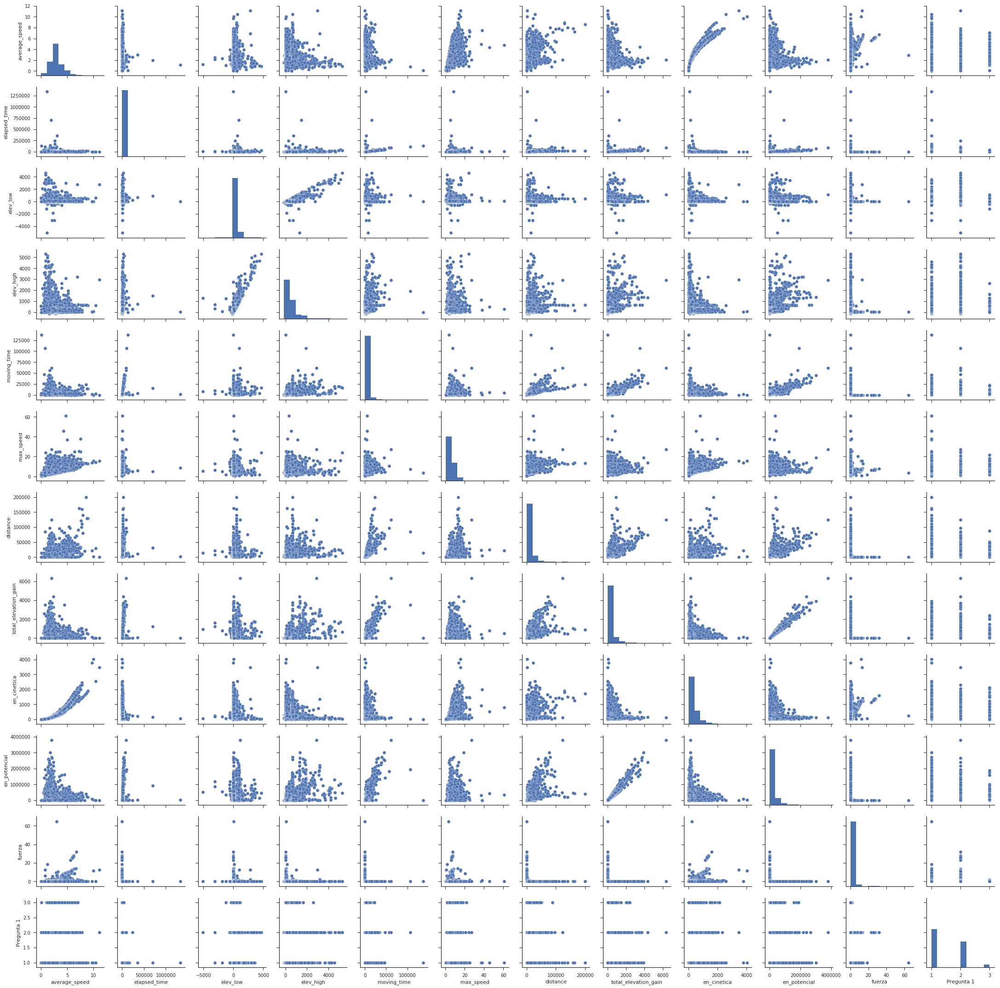

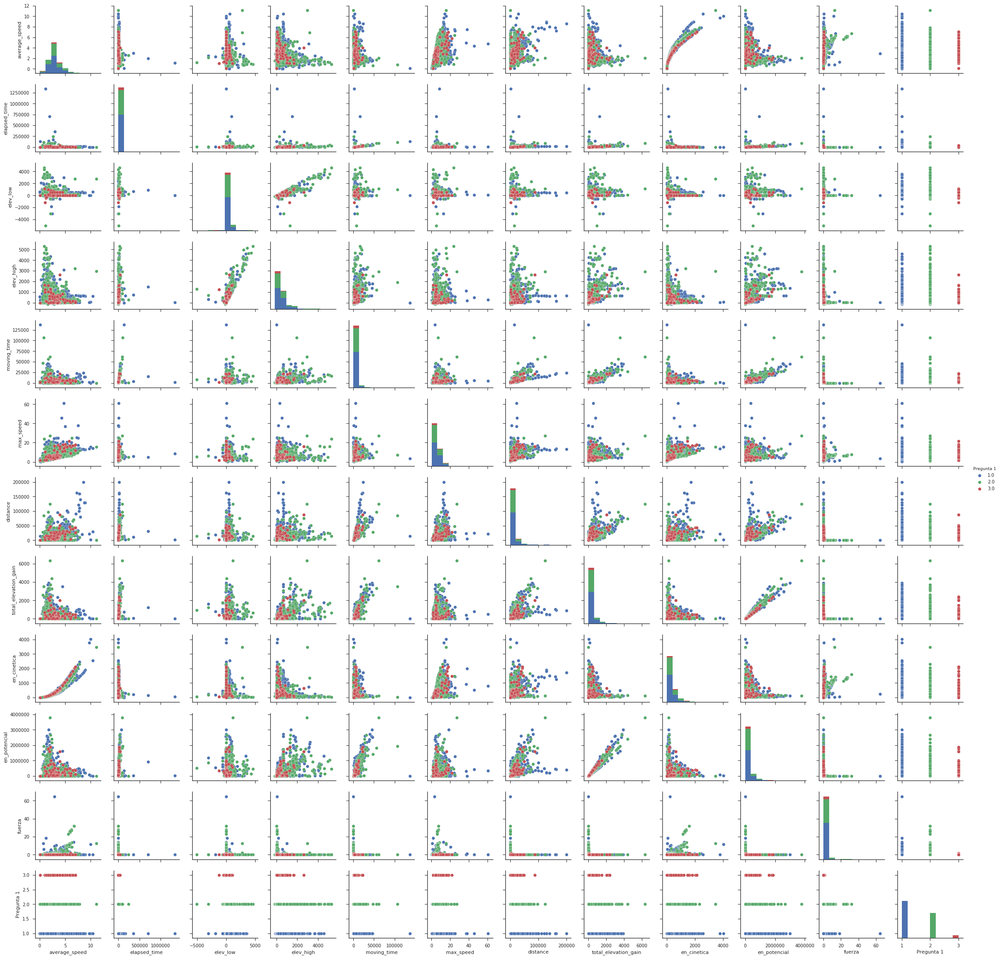

In [97]:
sns.pairplot(data_ag.loc[:, features_strava_lesion])
sns.pairplot(data_ag.loc[:, features_strava_lesion], hue="Pregunta 1")


/home/gabriela/.local/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


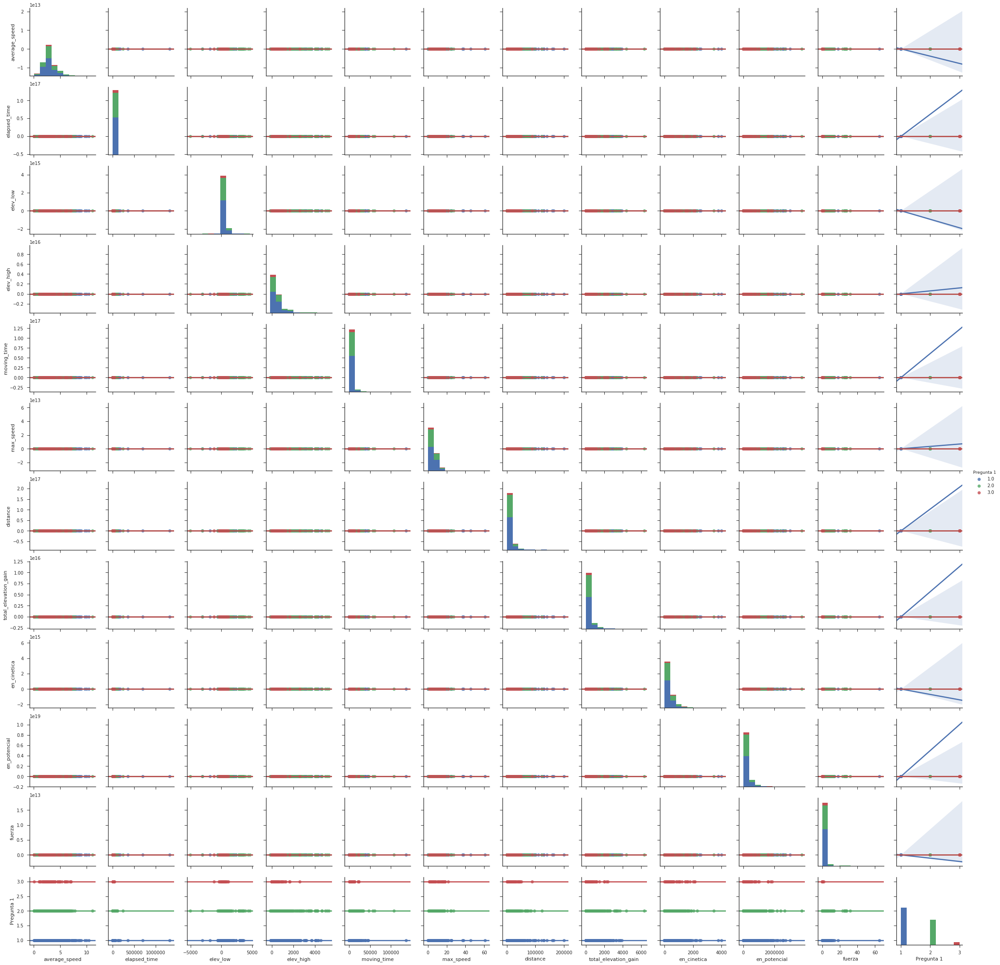

In [106]:
sns.pairplot(data_ag.loc[:, features_strava_lesion], kind="reg", hue="Pregunta 1")

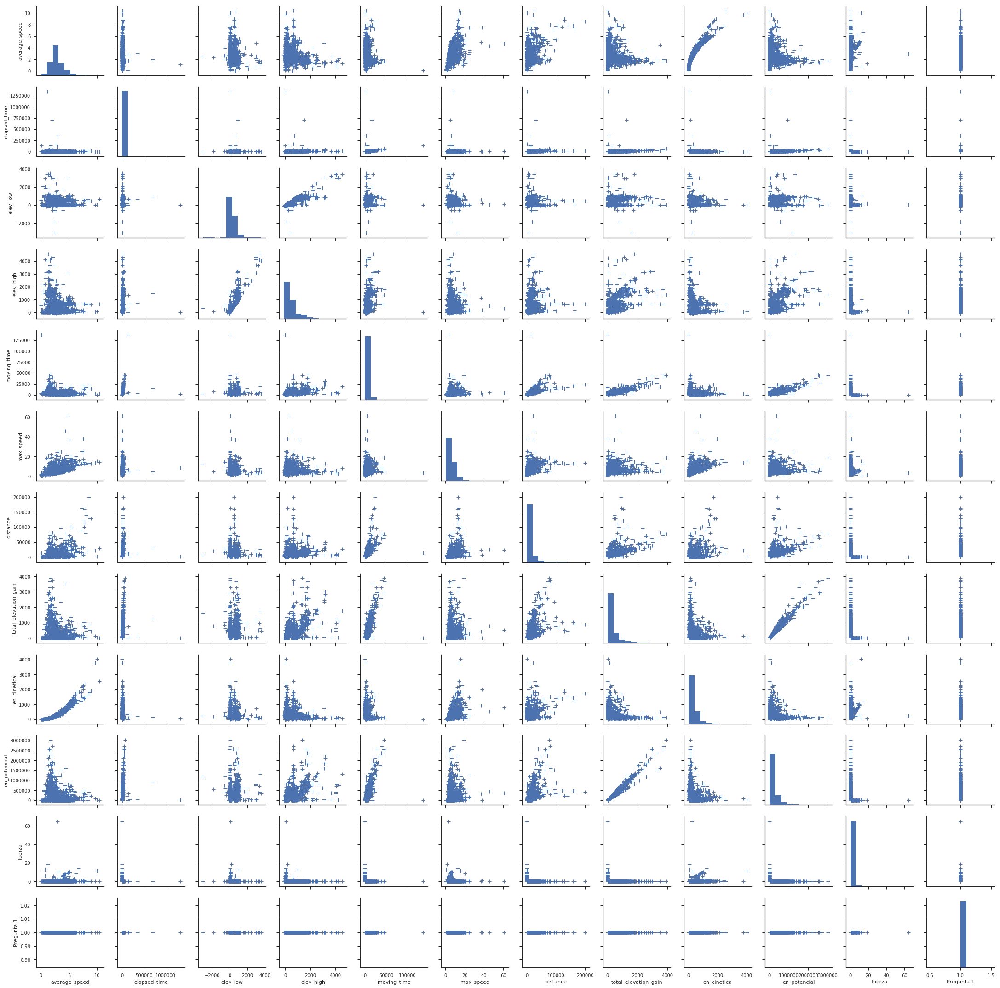

In [99]:
sns.pairplot(data_ag[ data_ag['Pregunta 1'] == 1 ].loc[:, features_strava_lesion], markers="+",plot_kws=dict(s=50, edgecolor="b", linewidth=1)) 

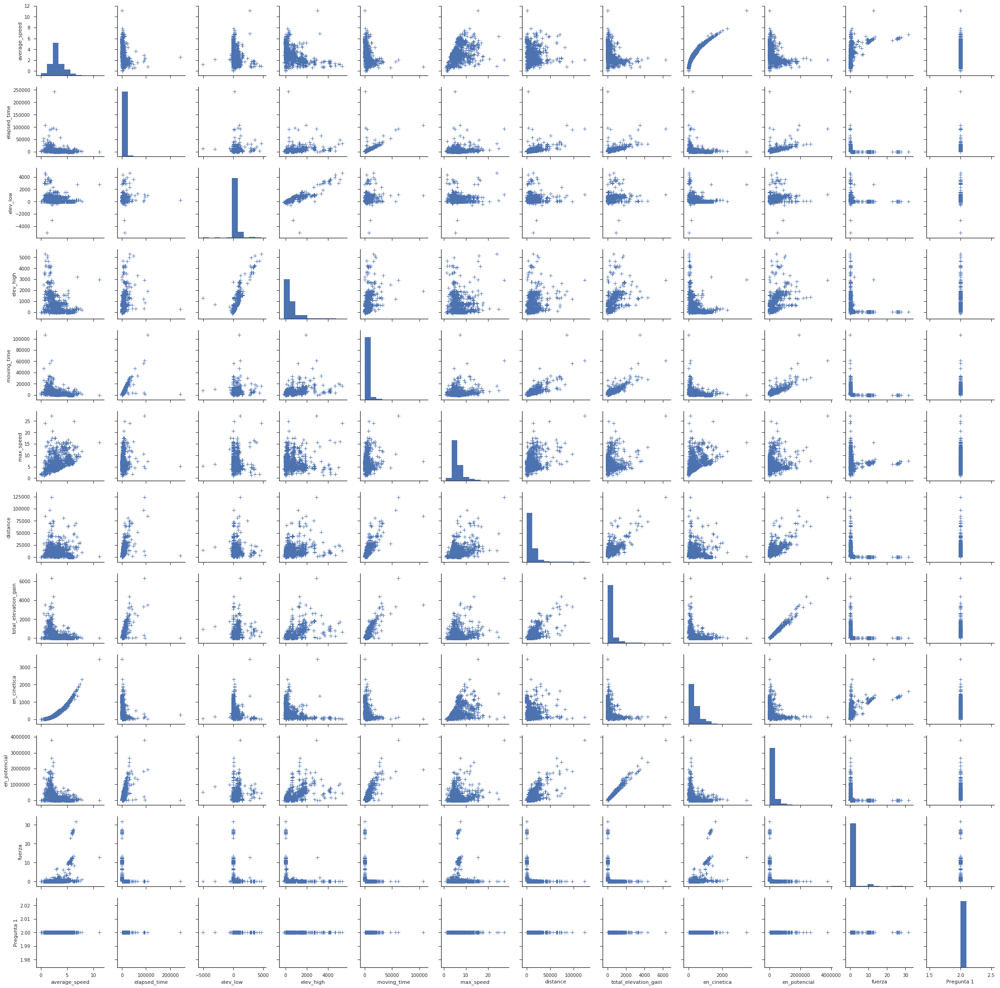

In [100]:
sns.pairplot(data_ag[ data_ag['Pregunta 1'] == 2 ].loc[:, features_strava_lesion], markers="+",plot_kws=dict(s=50, edgecolor="g", linewidth=1)) 

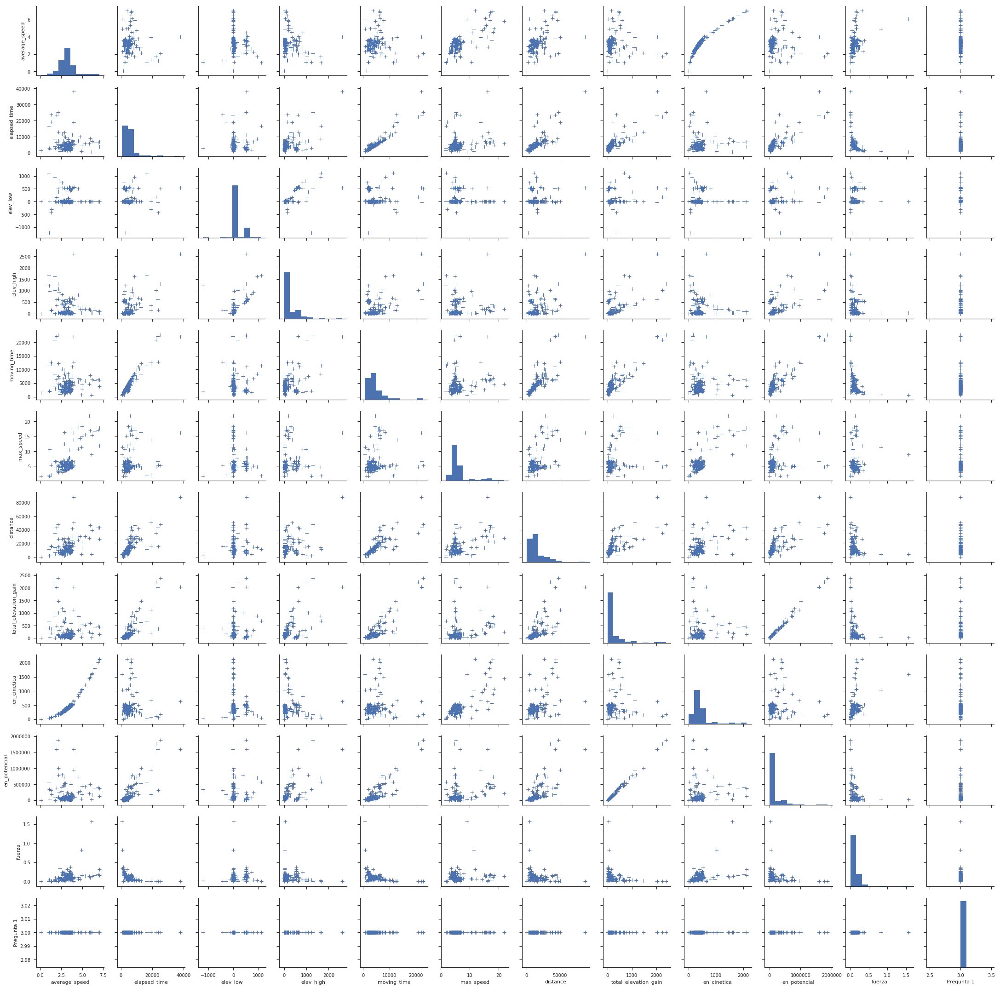

In [101]:
sns.pairplot(data_ag[ data_ag['Pregunta 1'] == 3 ].loc[:, features_strava_lesion], markers="+",plot_kws=dict(s=50, edgecolor="g", linewidth=1)) 

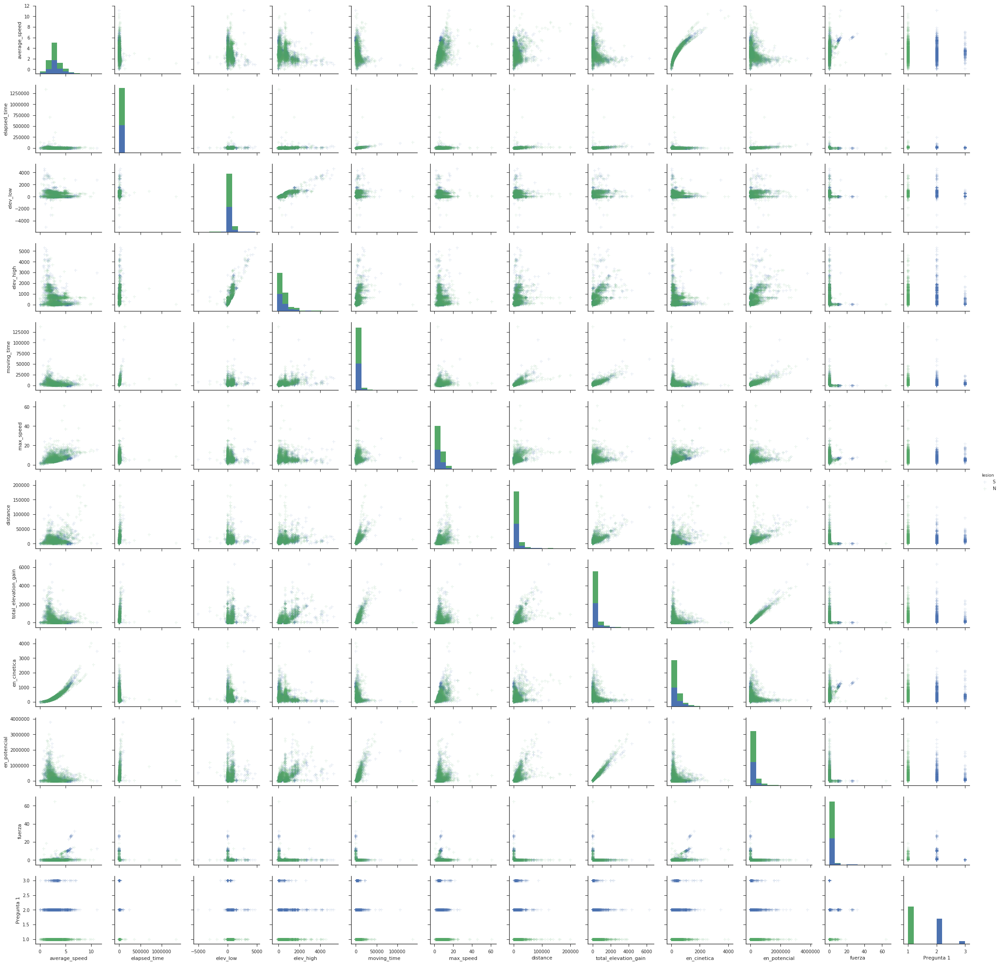

In [102]:
sns.pairplot(data_ag.loc[:, features_strava_lesion],markers="+", plot_kws={'alpha':0.1}, hue="lesion")


/home/gabriela/.local/lib/python3.5/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


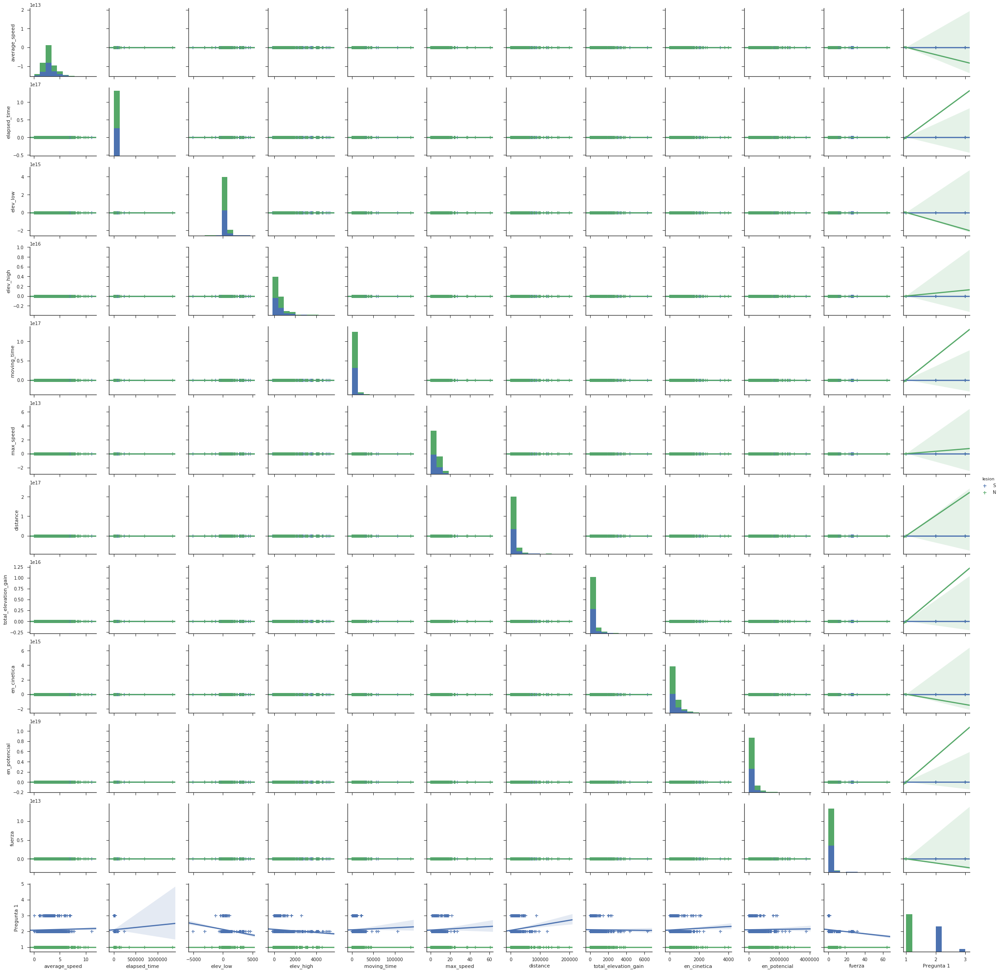

In [110]:
sns.pairplot(data_ag.loc[:, features_strava_lesion],markers="+", kind="reg", hue="lesion")


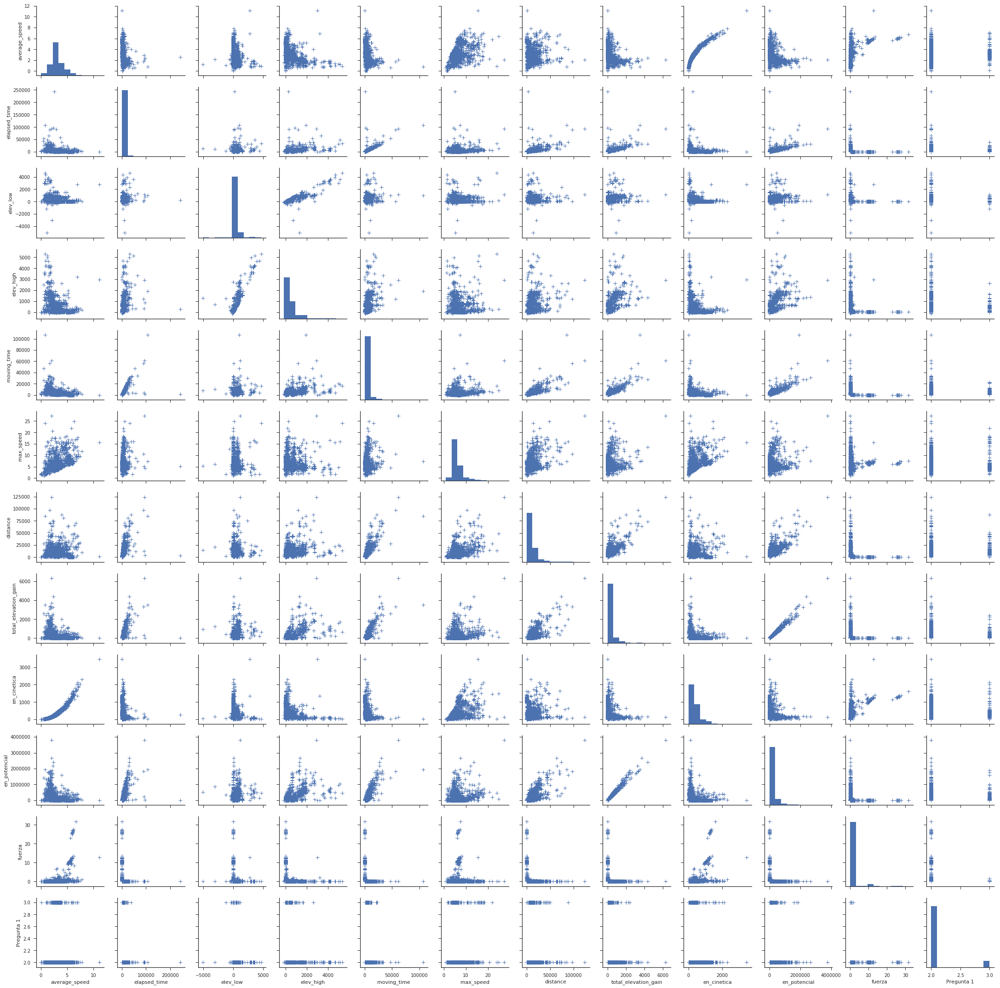

In [103]:
sns.pairplot(data_ag[ data_ag['lesion'] == 'S' ].loc[:, features_strava_lesion], markers="+",plot_kws=dict(s=50, edgecolor="green", linewidth=1)) 

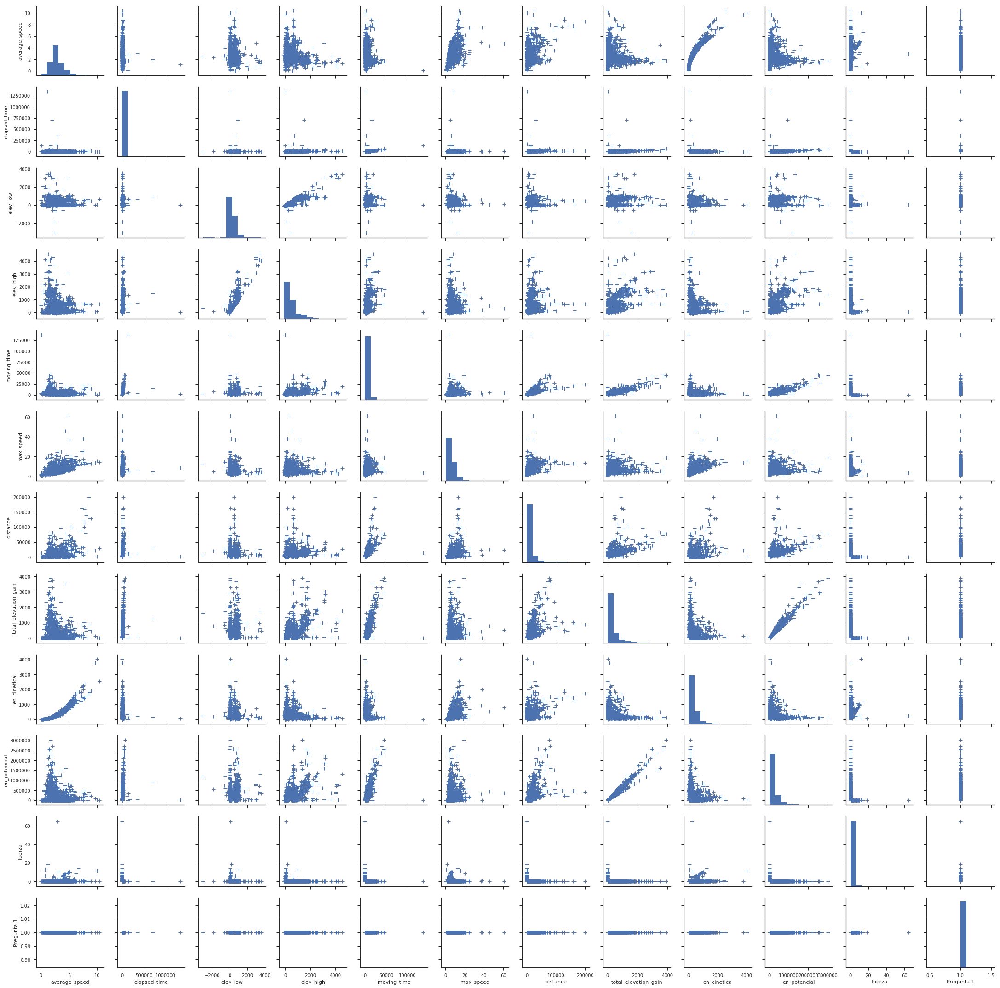

In [104]:
sns.pairplot(data_ag[ data_ag['lesion'] == 'N' ].loc[:, features_strava_lesion], markers="+",plot_kws=dict(s=50, edgecolor="blue", linewidth=1)) 

### PCA y Agrupamiento


In [197]:
data_ag[features_strava].dropna()

,average_speed,elapsed_time,elev_low,elev_high,moving_time,max_speed,distance,total_elevation_gain,en_cinetica,en_potencial,fuerza
0,1.799,14825,12.0,642.1,14518,4.6,26118.8,1475.9,110.037634,983539.76,0.016162
1,2.596,2962,14.1,80.6,2646,4.5,6868.0,132.4,229.133344,88231.36,0.106463
2,2.614,11877,3.5,427.8,10169,5.0,26579.4,1174.7,232.321864,782820.08,0.025625
3,2.900,3528,12.5,78.7,3516,4.5,10197.0,166.0,285.940000,110622.40,0.111418
4,2.626,7401,3.5,330.2,5715,5.1,15008.5,641.5,234.459784,427495.60,0.037265
5,3.113,3165,14.0,79.2,2893,6.5,9007.2,150.7,329.486146,100426.48,0.122287
6,3.011,3323,14.0,78.6,3109,6.5,9360.5,164.2,308.248114,109422.88,0.115286
7,3.197,2730,-10.2,2.2,2640,4.0,8440.9,37.0,347.507506,24656.80,0.154029
8,2.491,7295,3.2,329.7,6039,5.6,15042.7,640.6,210.972754,426895.84,0.038443
9,2.861,3249,13.8,80.8,3148,4.9,9007.4,151.0,278.300914,100626.40,0.116048


In [125]:
data_ag = data_ag[ data_ag['elev_high'] != 0 ][ data_ag['elev_high'] != 0 ]
len(data_ag)

4174

In [233]:
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.cluster import KMeans

In [227]:
from matplotlib import colors
def calculaPCA(data, features, pred):
    # Standardizing the features
    x = data.loc[:, features].values

    # Separating out the target
    y = data.loc[:,[pred]].values
    # y2 = data_ag.loc[:,['lesion']].values

    x = StandardScaler().fit_transform(x)

    x_y = pd.concat([pd.DataFrame(data = x, columns = features), data[[pred]]], axis = 1) #set de datos normalizado

    # plt.title('pairplot datos normalizados')
    # print('pairplot datos normalizados')
    # sns.pairplot(x_y)

    pca = PCA(n_components=2)
    principalComponents = pca.fit_transform(x)
    principalDf = pd.DataFrame(data = principalComponents
                 , columns = ['principal component 1', 'principal component 2'])

    finalDf = pd.concat([principalDf, data[[pred]]], axis = 1) #PCA con lesion
    pca = PCA().fit(x) #pca -> para visualizar los componentes
    
    # Get the PCA components (loadings)
    PCs = pca.components_

    # Use quiver to generate the basic plot
    fig = plt.figure(figsize=(8,8))
    plt.quiver(np.zeros(PCs.shape[1]), np.zeros(PCs.shape[1]),
               PCs[0,:], PCs[1,:], 
               angles='xy', scale_units='xy', scale=1)

    # Add labels based on feature names (here just numbers)
    # feature_names = np.arange(PCs.shape[1])
    for i,j,z in zip(PCs[1,:]+0.02, PCs[0,:]+0.02, features):
        plt.text(j, i, z, ha='center', va='center')

    # Add unit circle
    circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
    plt.gca().add_artist(circle)

    # Ensure correct aspect ratio and axis limits
    plt.axis('equal')
    plt.xlim([-1.0,1.0])
    plt.ylim([-1.0,1.0])

    # Label axes
    plt.xlabel('Componente principal 1')
    plt.ylabel('Componente principal 2')

    # Done
    plt.show()

    fig = plt.figure(figsize=(8,8))
    data_pca = pca.transform(x)
    #plt.scatter(data_pca[:,0], data_pca[:,1], alpha=.1)
    plt.hist2d(data_pca[:, 0], data_pca[:, 1], normed=True, bins=100, norm=colors.LogNorm())
    plt.xlabel('Componente principal 1') and plt.ylabel('Componente principal 2')
    plt.title("Analisis de componentes principales ")
    plt.show()
    
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel('Componente Principal 1', fontsize = 15)
    ax.set_ylabel('Componente Principal 2', fontsize = 15)
    ax.set_title('PCA y Lesion', fontsize = 20)
    targets = ['S', 'N']
    colorsPlot = ['b', 'g']
    for target, color in zip(targets,colorsPlot):
        indicesToKeep = finalDf['lesion'] == target
        ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
                   , finalDf.loc[indicesToKeep, 'principal component 2']
                   , c = color
                   , s = 50, alpha=0.3)
    ax.legend(targets)
    ax.grid()
    plt.show()

    return principalDf

In [251]:
def calculaK_kmeans(data, features, pred_v):

    # Standardizing the features
    x = data.loc[:, features].values

    # Separating out the target
    y = data.loc[:,[pred_v]].values
    # y2 = data_ag.loc[:,['lesion']].values

    x = StandardScaler().fit_transform(x)

    x_y = pd.concat([pd.DataFrame(data = x, columns = features), data[[pred_v]]], axis = 1) #set de datos normalizado
#     print(x_y.dropna())
    x_y = x_y.dropna()
    x_y_strava = x_y.loc[:,features]
#     print(x_y_strava)

    xx = []
    yy = []
    for K in range(2,20):
        y_pred = KMeans(n_clusters=K).fit_predict(x_y_strava)
        k_means = KMeans(n_clusters= K)
        k_means.fit(x_y_strava)
    #     print(k_means)

        xx.append(K)
        yy.append(k_means.inertia_)
        x_y_pred = pd.concat([x_y,  pd.DataFrame(data = y_pred, columns = ['pred'])], axis = 1) #set de datos normalizado
    #     sns.pairplot(x_y_pred, hue="pred")
        plt.show()
    #Falta relacionar los grupos con las lesiones. 

    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    plt.plot(xx, yy, '*-')
#     plt.plot(9, yy[7], 'o')
    

In [263]:
def calculaKMeans(data, pDf, features, pred_v, K):
    
    # Standardizing the features
    x = data.loc[:, features].values

    # Separating out the target
    y = data.loc[:,[pred_v]].values
    # y2 = data_ag.loc[:,['lesion']].values

    x = StandardScaler().fit_transform(x)

    x_y = pd.concat([pd.DataFrame(data = x, columns = features), data[[pred_v]]], axis = 1) #set de datos normalizado
    x_y = x_y.dropna()
    print(x_y)
    x_y_strava = x_y.loc[:,features]
    
    
    y_pred = KMeans(n_clusters=K).fit_predict(x_y_strava)
    
    x_y_pred = pd.concat([x_y,  pd.DataFrame(data = y_pred, columns = ['pred'])], axis = 1) #set de datos normalizado
    x_y_pred = x_y_pred.dropna()
    print(x_y_pred)
    sns.pairplot(x_y_pred.dropna(), hue="pred")
    plt.show()

    finalDf_KMEANS = pd.concat([pDf, x_y_pred[['pred']]], axis = 1)
    imprime_pca(finalDf_KMEANS)
    return finalDf_KMEANS
    

In [264]:
# finalDf_KMEANS = pd.concat([principalDf, x_y_pred[['pred']]], axis = 1) #PCA con grupo

def imprime_pca(final_DF):
    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1) 
    ax.set_xlabel('Componente Principal 1', fontsize = 15)
    ax.set_ylabel('Componente Principal 2', fontsize = 15)
    ax.set_title('PCA y Lesion', fontsize = 20)
    targets = final_DF['pred'].unique() #[1.0, 2.0, 3.0] 
#     targets_2 = x_y_pred['Pregunta 1'].unique() #[1.0, 2.0, 3.0] 

    colors = ['b', 'g', 'r', 'y', 'orange', 'pink', 'black', 'gray' ]
    for target, color in zip(targets,colors):
        indicesToKeep = final_DF['pred'] == target
        ax.scatter(final_DF.loc[indicesToKeep, 'principal component 1']
                   , final_DF.loc[indicesToKeep, 'principal component 2']
                   , c = color
                   , s = 50, alpha=0.3)
    ax.legend(targets)
    ax.grid()
    plt.show()

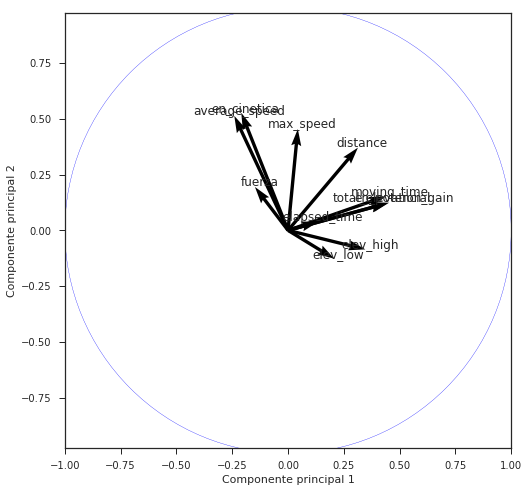

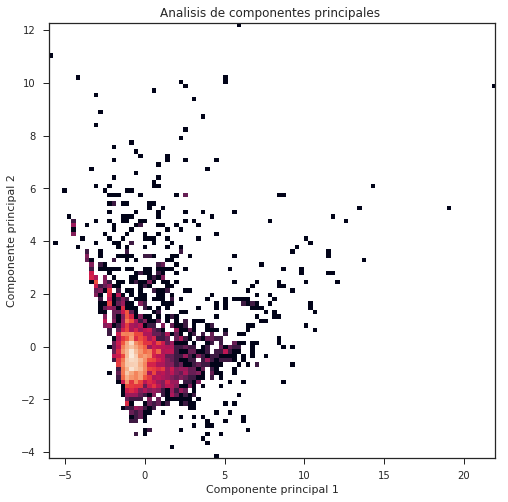

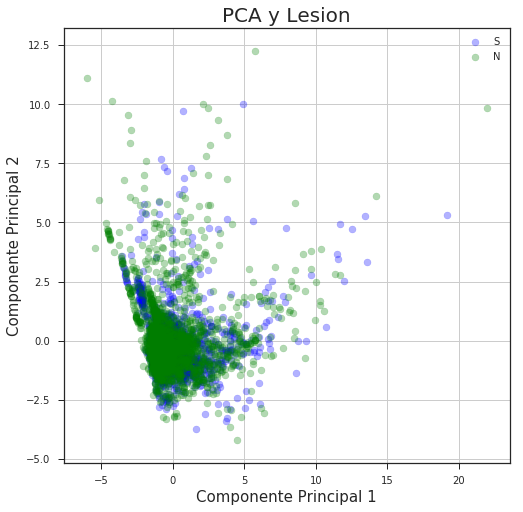

In [241]:
finalDF_1 = calculaPCA(data_ag, features_strava, 'lesion')

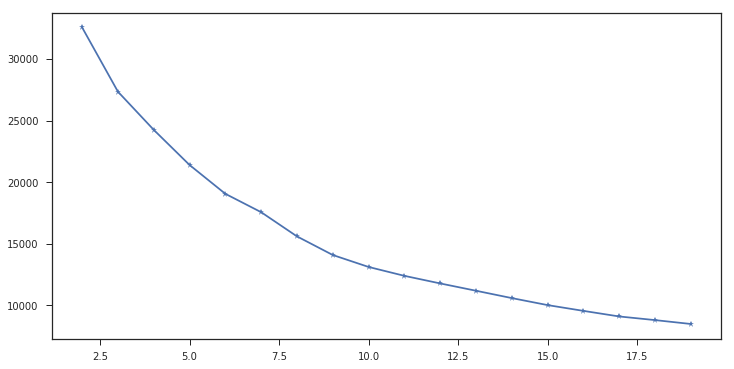

In [223]:

calculaK_kmeans(data_ag, features_strava, 'lesion') # K = 6 o 5 o 9 

      average_speed  elapsed_time  elev_low  elev_high  moving_time  \
0         -1.036705      0.348534 -0.655449   0.261558     2.087605   
1         -0.348442     -0.117516 -0.650795  -0.664781    -0.354069   
2         -0.332897      0.232719 -0.674291  -0.091985     1.193161   
3         -0.085917     -0.095280 -0.654341  -0.667915    -0.175139   
4         -0.322535      0.056875 -0.674291  -0.253001     0.277122   
5          0.098023     -0.109541 -0.651016  -0.667090    -0.303269   
6          0.009939     -0.103333 -0.651016  -0.668080    -0.258845   
7          0.170562     -0.126630 -0.704658  -0.794122    -0.355303   
8         -0.439116      0.052711 -0.674956  -0.253826     0.343758   
9         -0.119596     -0.106241 -0.651460  -0.664451    -0.250824   
10         0.658478     -0.202491 -0.660991  -0.762611    -0.733935   
11         0.677477     -0.192238 -0.660991  -0.764921    -0.680256   
12         0.752607     -0.183045 -0.660991  -0.764756    -0.632130   
13    

      average_speed  elapsed_time  elev_low  elev_high  moving_time  \
0         -1.036705      0.348534 -0.655449   0.261558     2.087605   
1         -0.348442     -0.117516 -0.650795  -0.664781    -0.354069   
2         -0.332897      0.232719 -0.674291  -0.091985     1.193161   
3         -0.085917     -0.095280 -0.654341  -0.667915    -0.175139   
4         -0.322535      0.056875 -0.674291  -0.253001     0.277122   
5          0.098023     -0.109541 -0.651016  -0.667090    -0.303269   
6          0.009939     -0.103333 -0.651016  -0.668080    -0.258845   
7          0.170562     -0.126630 -0.704658  -0.794122    -0.355303   
8         -0.439116      0.052711 -0.674956  -0.253826     0.343758   
9         -0.119596     -0.106241 -0.651460  -0.664451    -0.250824   
10         0.658478     -0.202491 -0.660991  -0.762611    -0.733935   
11         0.677477     -0.192238 -0.660991  -0.764921    -0.680256   
12         0.752607     -0.183045 -0.660991  -0.764756    -0.632130   
13    

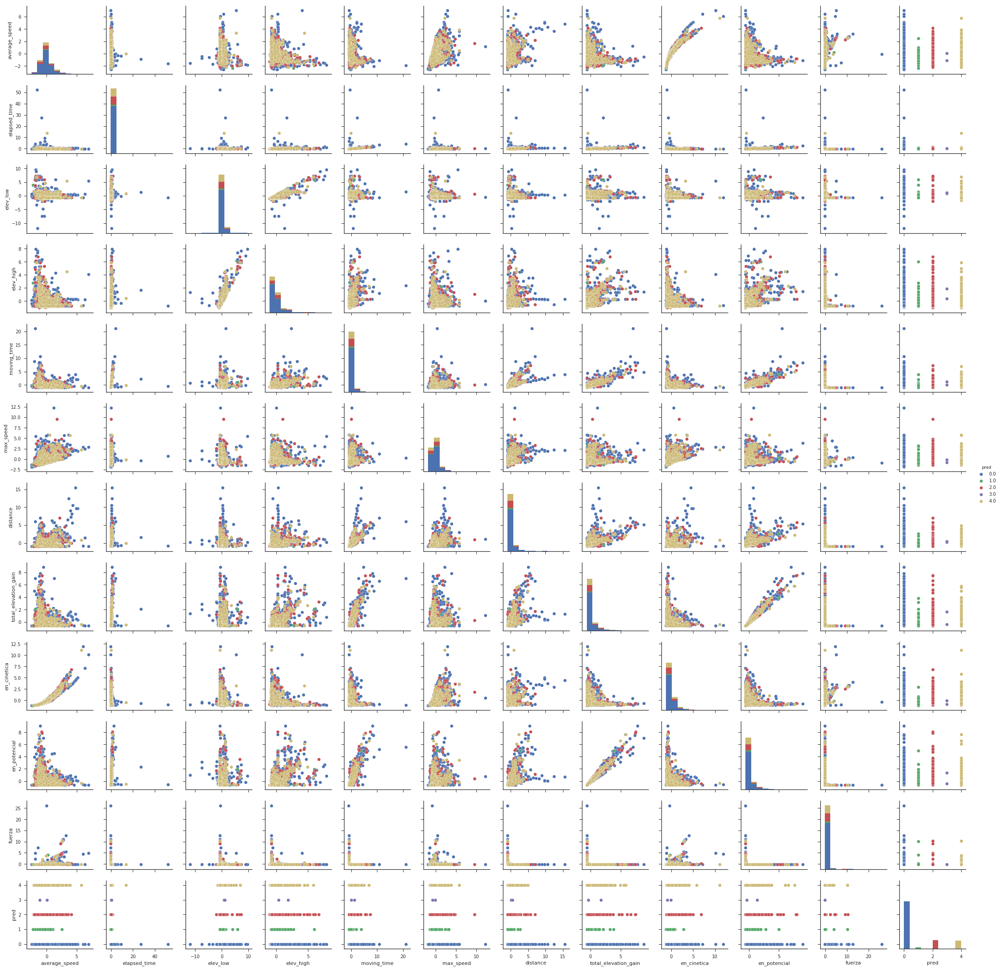

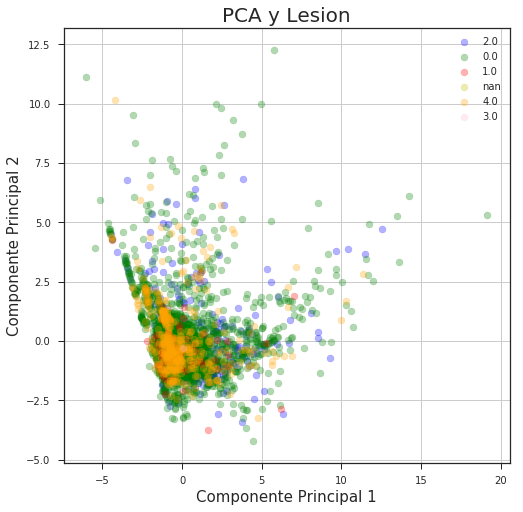

In [270]:
df_KMeans_1_5 = calculaKMeans(data_ag, finalDF_1, features_strava, 'lesion', 5)

      average_speed  elapsed_time  elev_low  elev_high  moving_time  \
0         -1.036705      0.348534 -0.655449   0.261558     2.087605   
1         -0.348442     -0.117516 -0.650795  -0.664781    -0.354069   
2         -0.332897      0.232719 -0.674291  -0.091985     1.193161   
3         -0.085917     -0.095280 -0.654341  -0.667915    -0.175139   
4         -0.322535      0.056875 -0.674291  -0.253001     0.277122   
5          0.098023     -0.109541 -0.651016  -0.667090    -0.303269   
6          0.009939     -0.103333 -0.651016  -0.668080    -0.258845   
7          0.170562     -0.126630 -0.704658  -0.794122    -0.355303   
8         -0.439116      0.052711 -0.674956  -0.253826     0.343758   
9         -0.119596     -0.106241 -0.651460  -0.664451    -0.250824   
10         0.658478     -0.202491 -0.660991  -0.762611    -0.733935   
11         0.677477     -0.192238 -0.660991  -0.764921    -0.680256   
12         0.752607     -0.183045 -0.660991  -0.764756    -0.632130   
13    

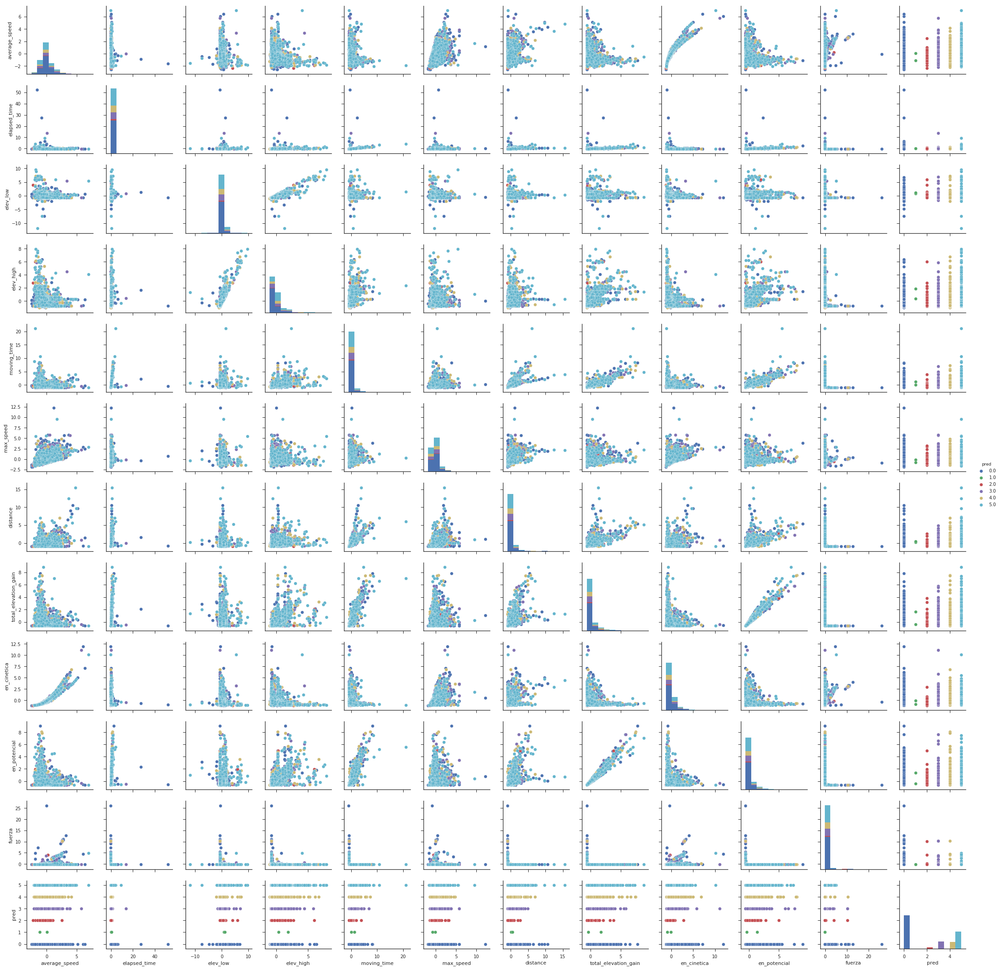

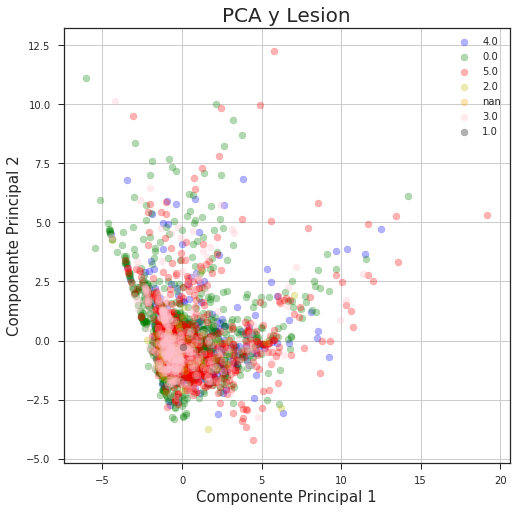

In [269]:
df_KMeans_1_6 = calculaKMeans(data_ag, finalDF_1, features_strava, 'lesion', 6)

      average_speed  elapsed_time  elev_low  elev_high  moving_time  \
0         -1.036705      0.348534 -0.655449   0.261558     2.087605   
1         -0.348442     -0.117516 -0.650795  -0.664781    -0.354069   
2         -0.332897      0.232719 -0.674291  -0.091985     1.193161   
3         -0.085917     -0.095280 -0.654341  -0.667915    -0.175139   
4         -0.322535      0.056875 -0.674291  -0.253001     0.277122   
5          0.098023     -0.109541 -0.651016  -0.667090    -0.303269   
6          0.009939     -0.103333 -0.651016  -0.668080    -0.258845   
7          0.170562     -0.126630 -0.704658  -0.794122    -0.355303   
8         -0.439116      0.052711 -0.674956  -0.253826     0.343758   
9         -0.119596     -0.106241 -0.651460  -0.664451    -0.250824   
10         0.658478     -0.202491 -0.660991  -0.762611    -0.733935   
11         0.677477     -0.192238 -0.660991  -0.764921    -0.680256   
12         0.752607     -0.183045 -0.660991  -0.764756    -0.632130   
13    

      average_speed  elapsed_time  elev_low  elev_high  moving_time  \
0         -1.036705      0.348534 -0.655449   0.261558     2.087605   
1         -0.348442     -0.117516 -0.650795  -0.664781    -0.354069   
2         -0.332897      0.232719 -0.674291  -0.091985     1.193161   
3         -0.085917     -0.095280 -0.654341  -0.667915    -0.175139   
4         -0.322535      0.056875 -0.674291  -0.253001     0.277122   
5          0.098023     -0.109541 -0.651016  -0.667090    -0.303269   
6          0.009939     -0.103333 -0.651016  -0.668080    -0.258845   
7          0.170562     -0.126630 -0.704658  -0.794122    -0.355303   
8         -0.439116      0.052711 -0.674956  -0.253826     0.343758   
9         -0.119596     -0.106241 -0.651460  -0.664451    -0.250824   
10         0.658478     -0.202491 -0.660991  -0.762611    -0.733935   
11         0.677477     -0.192238 -0.660991  -0.764921    -0.680256   
12         0.752607     -0.183045 -0.660991  -0.764756    -0.632130   
13    

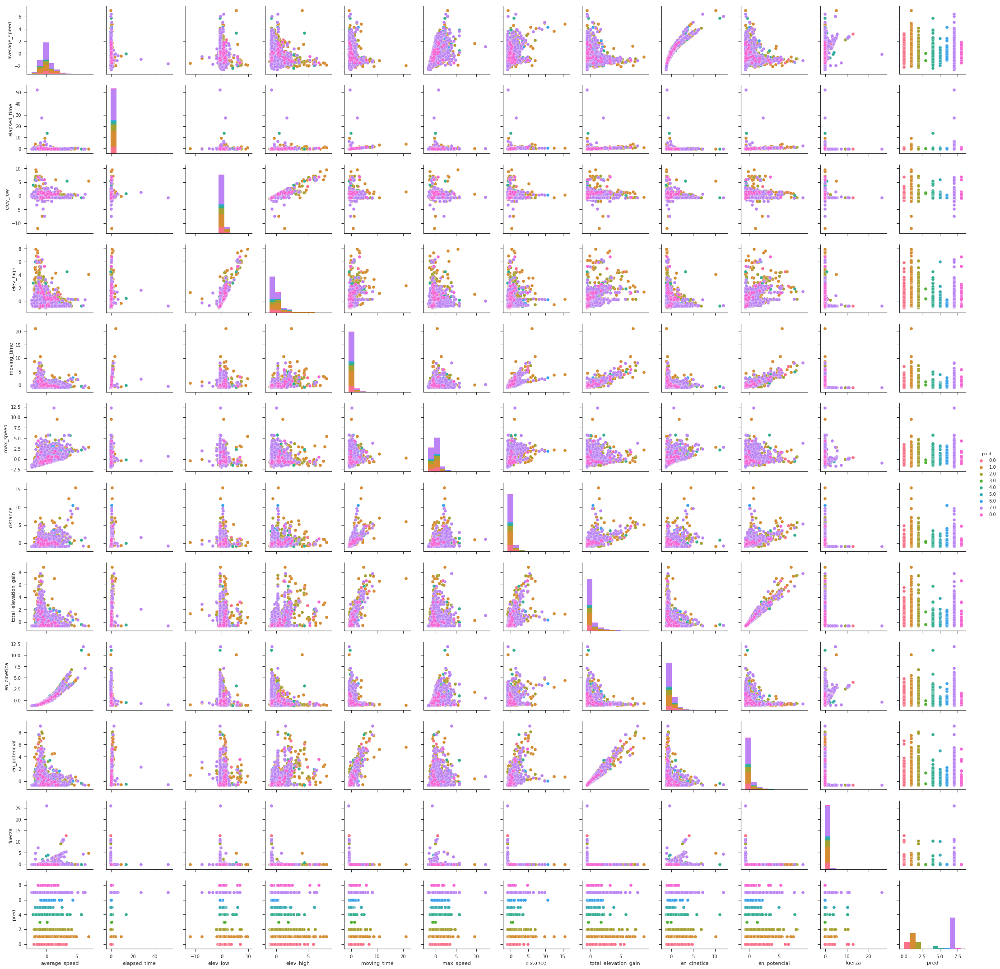

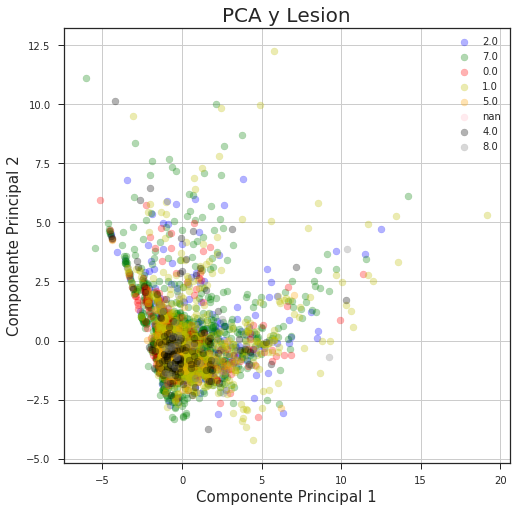

In [268]:
df_KMeans_1_9 = calculaKMeans(data_ag, finalDF_1, features_strava, 'lesion', 9)

In [131]:
features_strava

['average_speed',
 'elapsed_time',
 'elev_low',
 'elev_high',
 'moving_time',
 'max_speed',
 'distance',
 'total_elevation_gain',
 'en_cinetica',
 'en_potencial',
 'fuerza']

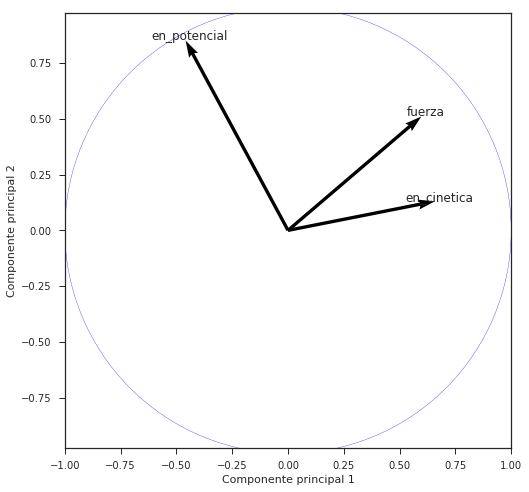

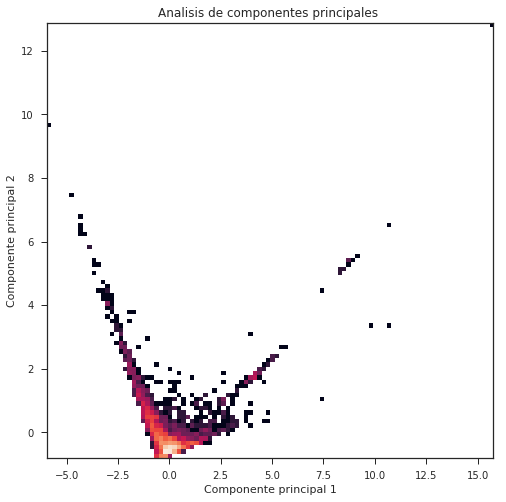

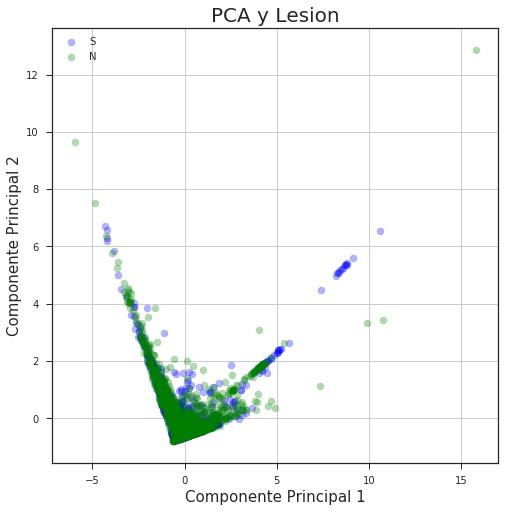

In [149]:
features_calc = ['en_cinetica',
                 'en_potencial',
                 'fuerza']
finalDF_2 = calculaPCA(data_ag, features_calc, 'lesion')

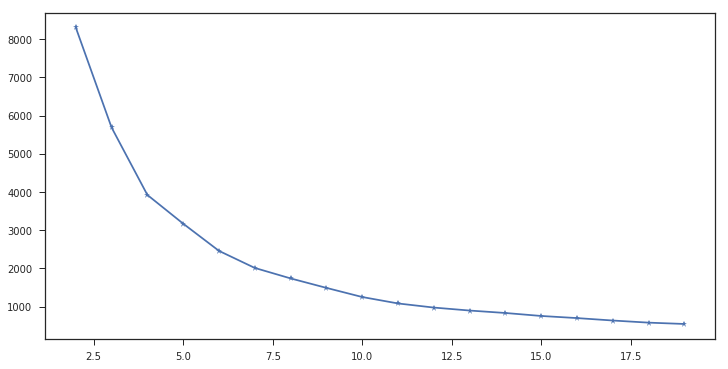

In [249]:
calculaK_kmeans(data_ag, features_calc, 'lesion') # K = 6 o 5 o 9 

In [256]:
features_calc

['en_cinetica', 'en_potencial', 'fuerza']

      en_cinetica  en_potencial    fuerza lesion
0       -0.813316      2.525847 -0.212974      S
1       -0.425415     -0.340886 -0.176197      S
2       -0.415029      1.883153 -0.209120      S
3       -0.240392     -0.269191 -0.174180      S
4       -0.408066      0.745422 -0.204380      S
5       -0.098560     -0.301838 -0.169753      S
6       -0.167733     -0.273032 -0.172604      S
7       -0.039863     -0.544448 -0.156825      S
8       -0.484565      0.743501 -0.203900      S
9       -0.265273     -0.301197 -0.172294      S
10       0.395547     -0.558318  0.041264      S
11       0.413931     -0.543381 -0.021838      S
12       0.487683     -0.516709 -0.053882      S
13      -0.522641      0.851470 -0.202623      S
14       0.091925     -0.606328  0.121178      S
15      -0.399317     -0.512228 -0.140503      S
16       0.155552     -0.609315  0.067104      S
17       0.121272     -0.603554  0.106568      S
18      -0.559112     -0.417275 -0.183412      S
19      -0.136823   

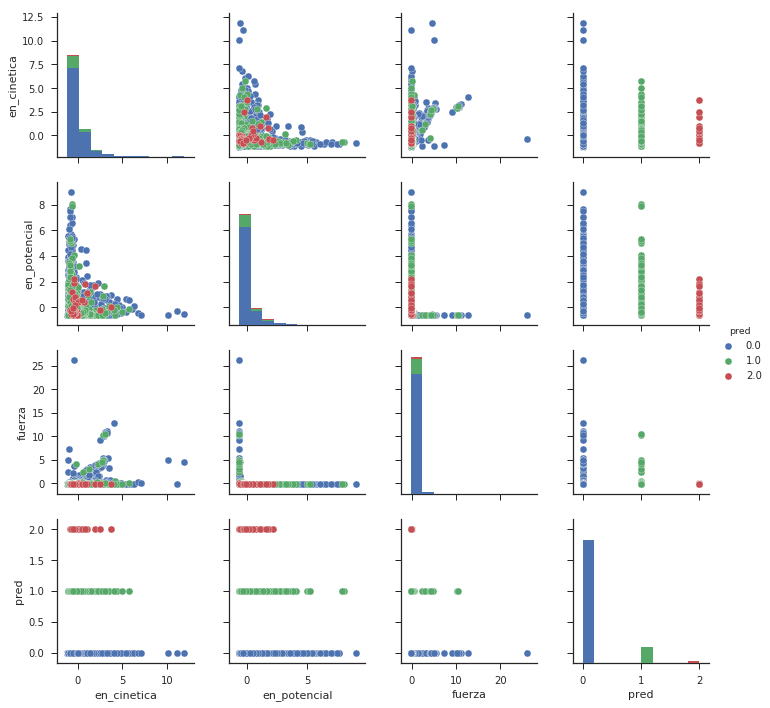

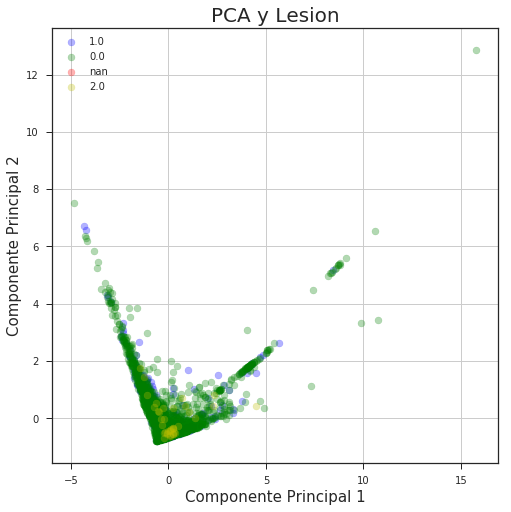

In [267]:
df_KMeans_2_3 = calculaKMeans(data_ag, finalDF_2, features_calc, 'lesion', 3)

In [ ]:
data_ag = data_ag[data_ag['Fecha de nacimiento'] != 'EDAD']  
data_ag['Fecha de nacimiento'] = pd.to_numeric(data_ag["Fecha de nacimiento"]) 


In [169]:
len(data_ag)

4086

In [170]:
data_ag['Fecha de nacimiento'] = data_ag.apply(lambda x: 2018 - x['Fecha de nacimiento'] , axis=1)


/home/gabriela/.local/lib/python3.5/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [175]:
features_strava_lesion
features_fisio + features_strava
features_num_all = ['Fecha de nacimiento',
#                      'Sexo (F/M)',
                     'Estatura',
                     'Peso',
#                      'Distancia',
#                      'Pregunta 1',
#                      'lesion',
#                      'Pregunta 2 Mes',
                     'average_speed',
                     'elapsed_time',
                     'elev_low',
                     'elev_high',
                     'moving_time',
                     'max_speed',
                     'distance',
                     'total_elevation_gain',
                     'en_cinetica',
                     'en_potencial',
                     'fuerza']

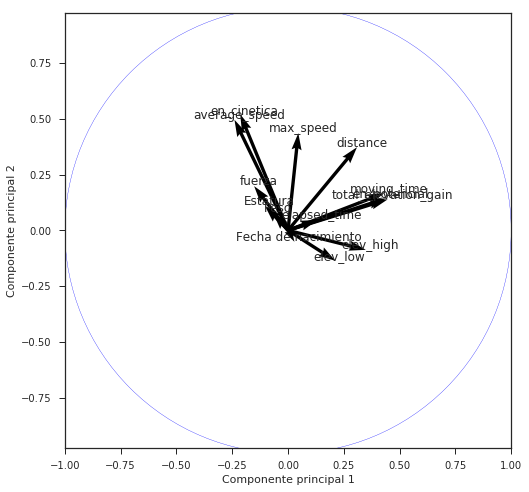

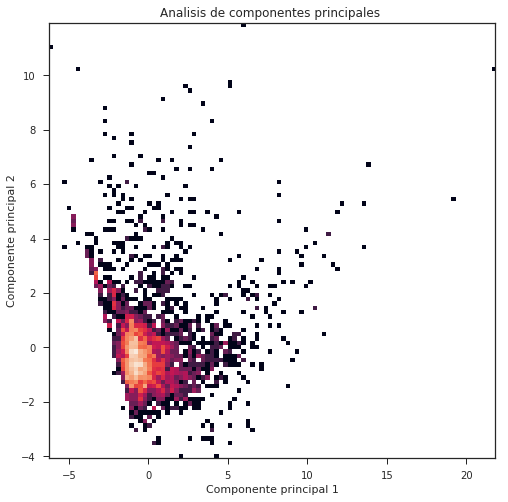

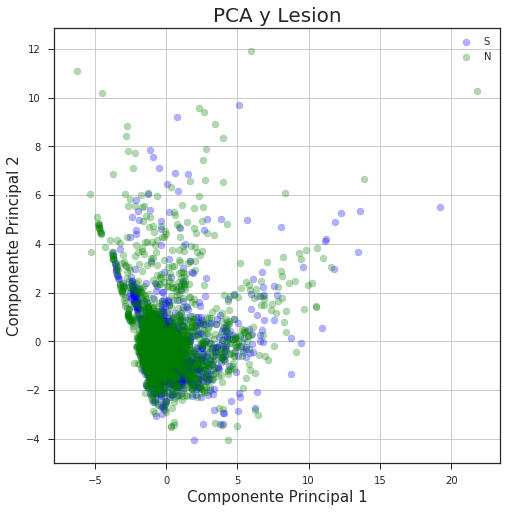

In [177]:
finalDF_3 = calculaPCA(data_ag, features_num_all, 'lesion')

      Fecha de nacimiento  Estatura      Peso  average_speed  elapsed_time  \
0                0.686523 -0.011677 -0.200220      -1.036705      0.348534   
1                0.686523 -0.011677 -0.200220      -0.348442     -0.117516   
2                0.686523 -0.011677 -0.200220      -0.332897      0.232719   
3                0.686523 -0.011677 -0.200220      -0.085917     -0.095280   
4                0.686523 -0.011677 -0.200220      -0.322535      0.056875   
5                0.686523 -0.011677 -0.200220       0.098023     -0.109541   
6                0.686523 -0.011677 -0.200220       0.009939     -0.103333   
7                0.686523 -0.011677 -0.200220       0.170562     -0.126630   
8                0.686523 -0.011677 -0.200220      -0.439116      0.052711   
9                0.686523 -0.011677 -0.200220      -0.119596     -0.106241   
10               0.686523 -0.011677 -0.200220       0.658478     -0.202491   
11               0.686523 -0.011677 -0.200220       0.677477    

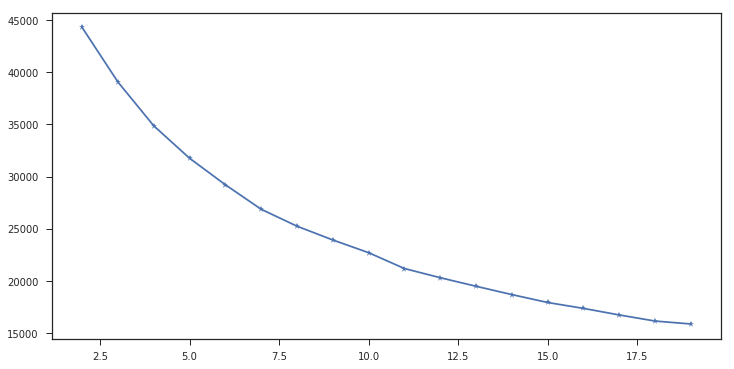

In [259]:
calculaK_kmeans(data_ag, features_num_all, 'lesion') # K = 6 o 5 o 9 

      Fecha de nacimiento  Estatura      Peso  average_speed  elapsed_time  \
0                0.686523 -0.011677 -0.200220      -1.036705      0.348534   
1                0.686523 -0.011677 -0.200220      -0.348442     -0.117516   
2                0.686523 -0.011677 -0.200220      -0.332897      0.232719   
3                0.686523 -0.011677 -0.200220      -0.085917     -0.095280   
4                0.686523 -0.011677 -0.200220      -0.322535      0.056875   
5                0.686523 -0.011677 -0.200220       0.098023     -0.109541   
6                0.686523 -0.011677 -0.200220       0.009939     -0.103333   
7                0.686523 -0.011677 -0.200220       0.170562     -0.126630   
8                0.686523 -0.011677 -0.200220      -0.439116      0.052711   
9                0.686523 -0.011677 -0.200220      -0.119596     -0.106241   
10               0.686523 -0.011677 -0.200220       0.658478     -0.202491   
11               0.686523 -0.011677 -0.200220       0.677477    

      Fecha de nacimiento  Estatura      Peso  average_speed  elapsed_time  \
0                0.686523 -0.011677 -0.200220      -1.036705      0.348534   
1                0.686523 -0.011677 -0.200220      -0.348442     -0.117516   
2                0.686523 -0.011677 -0.200220      -0.332897      0.232719   
3                0.686523 -0.011677 -0.200220      -0.085917     -0.095280   
4                0.686523 -0.011677 -0.200220      -0.322535      0.056875   
5                0.686523 -0.011677 -0.200220       0.098023     -0.109541   
6                0.686523 -0.011677 -0.200220       0.009939     -0.103333   
7                0.686523 -0.011677 -0.200220       0.170562     -0.126630   
8                0.686523 -0.011677 -0.200220      -0.439116      0.052711   
9                0.686523 -0.011677 -0.200220      -0.119596     -0.106241   
10               0.686523 -0.011677 -0.200220       0.658478     -0.202491   
11               0.686523 -0.011677 -0.200220       0.677477    

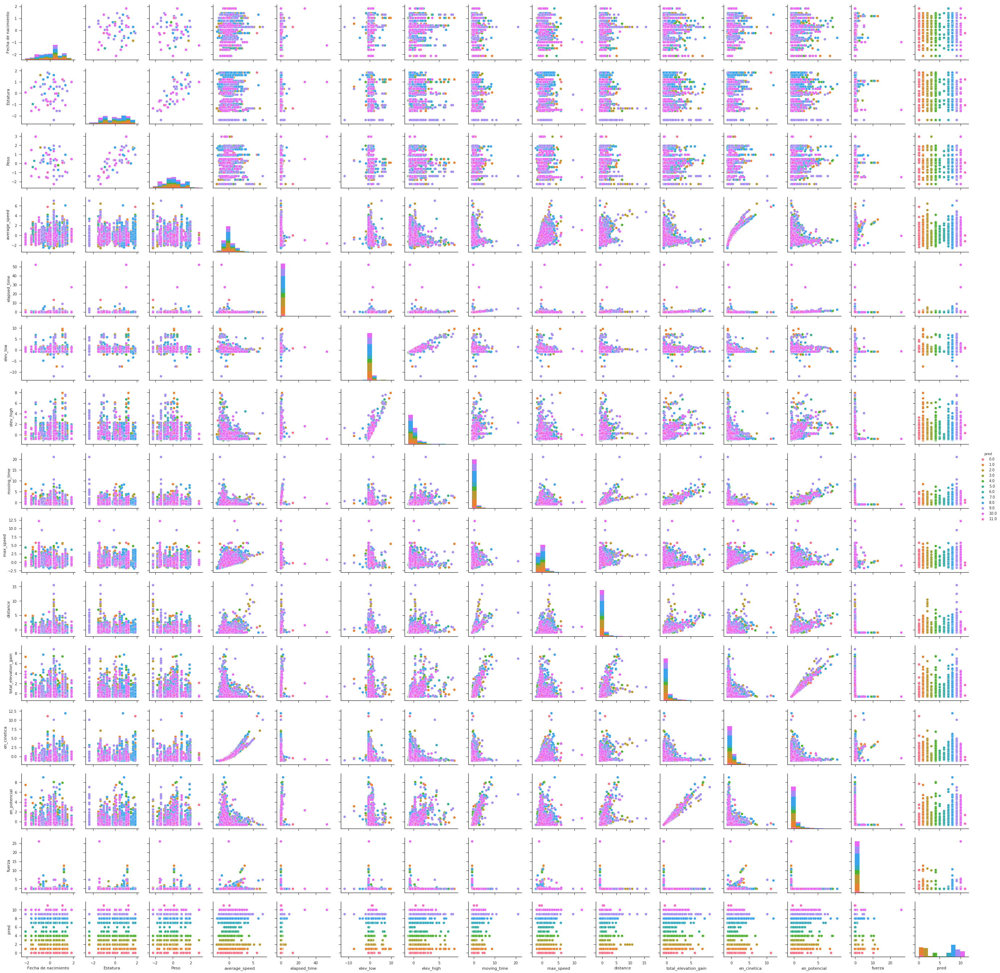

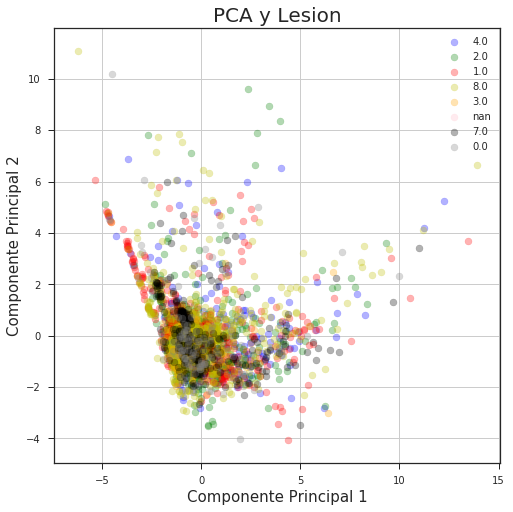

In [266]:
df_KMeans_2_3 = calculaKMeans(data_ag, finalDF_3, features_num_all, 'lesion', 12)

In [178]:
features_strava_lesion
features_fisio + features_strava
features_num = ['Fecha de nacimiento',
                     'Estatura',
                     'Peso',
                     'en_cinetica',
                     'en_potencial',
                     'fuerza']



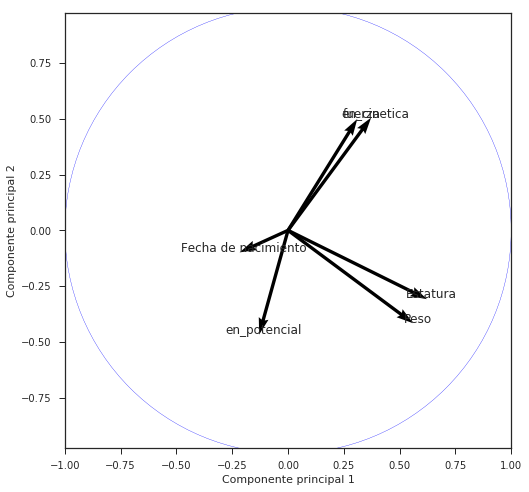

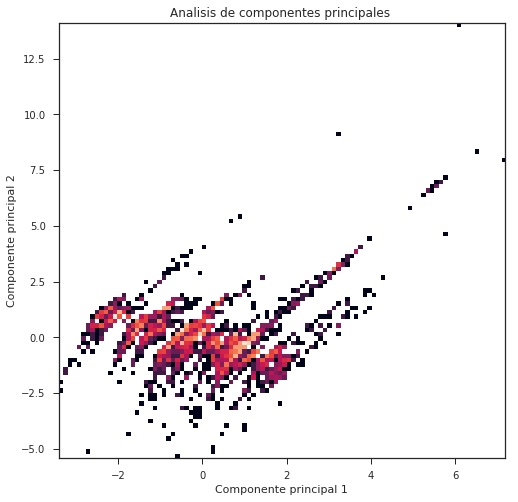

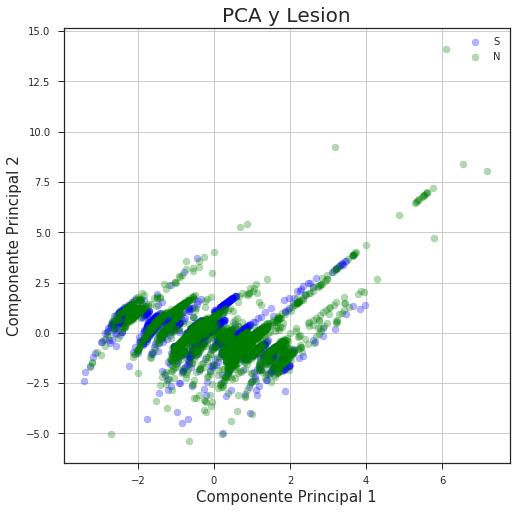

In [179]:
finalDF_4 = calculaPCA(data_ag, features_num, 'lesion')

      Fecha de nacimiento  Estatura      Peso  en_cinetica  en_potencial  \
0                0.686523 -0.011677 -0.200220    -0.813316      2.525847   
1                0.686523 -0.011677 -0.200220    -0.425415     -0.340886   
2                0.686523 -0.011677 -0.200220    -0.415029      1.883153   
3                0.686523 -0.011677 -0.200220    -0.240392     -0.269191   
4                0.686523 -0.011677 -0.200220    -0.408066      0.745422   
5                0.686523 -0.011677 -0.200220    -0.098560     -0.301838   
6                0.686523 -0.011677 -0.200220    -0.167733     -0.273032   
7                0.686523 -0.011677 -0.200220    -0.039863     -0.544448   
8                0.686523 -0.011677 -0.200220    -0.484565      0.743501   
9                0.686523 -0.011677 -0.200220    -0.265273     -0.301197   
10               0.686523 -0.011677 -0.200220     0.395547     -0.558318   
11               0.686523 -0.011677 -0.200220     0.413931     -0.543381   
12          

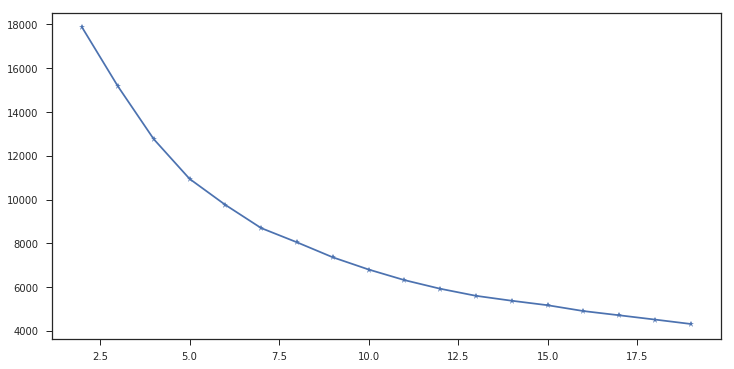

In [261]:
calculaK_kmeans(data_ag, features_num, 'lesion') # K = 6 o 5 o 9 

      Fecha de nacimiento  Estatura      Peso  en_cinetica  en_potencial  \
0                0.686523 -0.011677 -0.200220    -0.813316      2.525847   
1                0.686523 -0.011677 -0.200220    -0.425415     -0.340886   
2                0.686523 -0.011677 -0.200220    -0.415029      1.883153   
3                0.686523 -0.011677 -0.200220    -0.240392     -0.269191   
4                0.686523 -0.011677 -0.200220    -0.408066      0.745422   
5                0.686523 -0.011677 -0.200220    -0.098560     -0.301838   
6                0.686523 -0.011677 -0.200220    -0.167733     -0.273032   
7                0.686523 -0.011677 -0.200220    -0.039863     -0.544448   
8                0.686523 -0.011677 -0.200220    -0.484565      0.743501   
9                0.686523 -0.011677 -0.200220    -0.265273     -0.301197   
10               0.686523 -0.011677 -0.200220     0.395547     -0.558318   
11               0.686523 -0.011677 -0.200220     0.413931     -0.543381   
12          

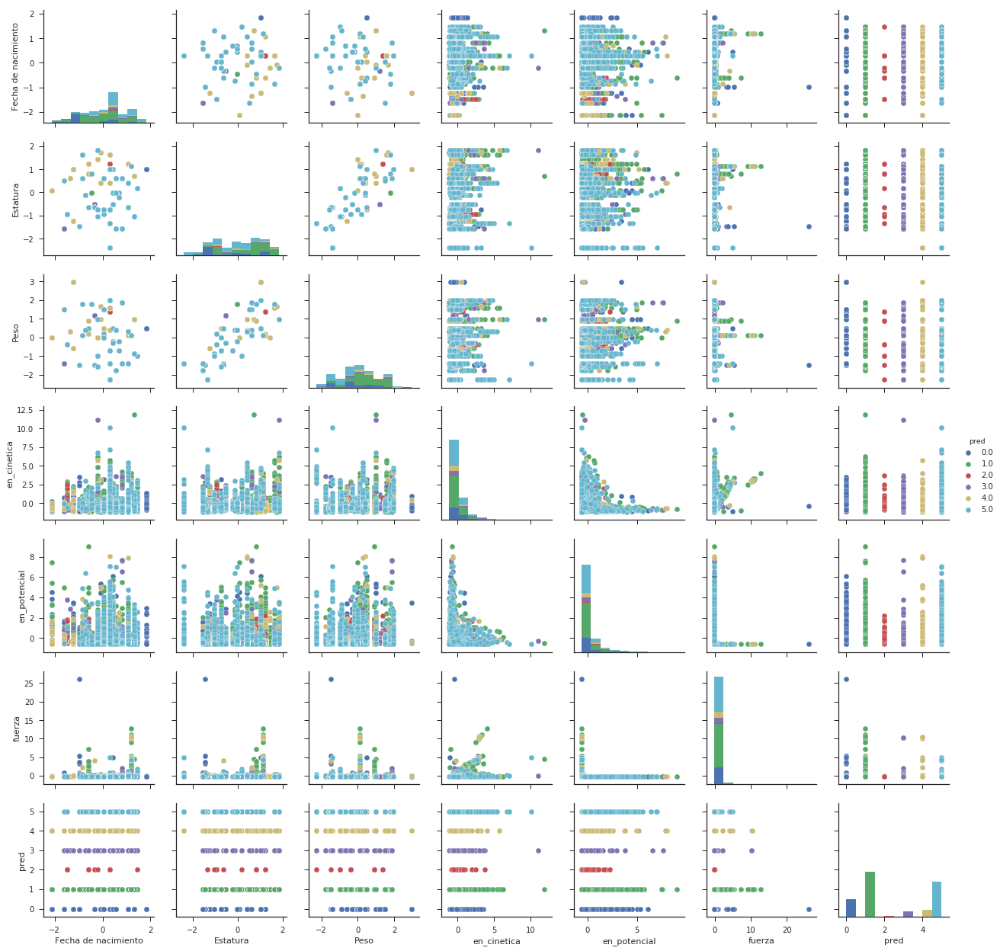

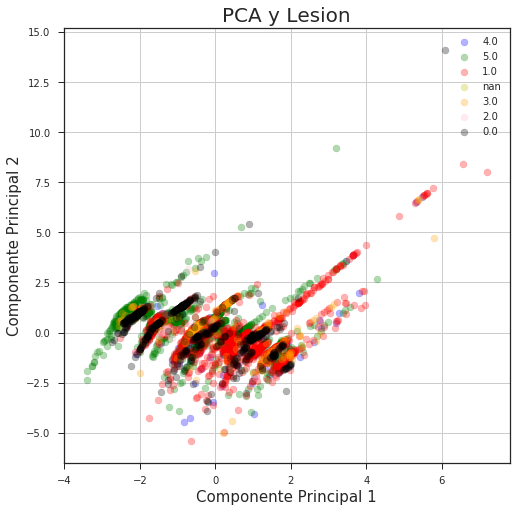

In [265]:
df_KMeans_2_3 = calculaKMeans(data_ag, finalDF_4, features_num, 'lesion', 6)

# EXTRA


Información útil : 


- Definición de PACE https://www.runnersworld.com/beginner/a20809963/how-to-measure-your-effort/
    Pace. This term refers to the number of minutes it takes to cover one mile. So if it takes you 15 minutes to walk one mile, you would be walking a “15-minute” pace, which might be expressed as 15:00/mile. Most training watches—made by companies like Garmin, Polar, Timex, and Nike—calculate pace for you by tracking how far you’ve gone and how long you’ve been going. Or you can track it yourself by simply timing your workout and figuring out how far you’ve gone.
    When you’re first starting out, it’s best to focus on the time you spend exercising, rather than pace, or the number of miles you cover and the amount of time it takes to cover those miles. It’s the time that you consistently spend working out that is going to determine how much fitness you develop and the overall health benefits you gain. As you get more comfortable running and walking, you can start to track your pace on each workout to gauge your fitness gains.


- Running Economy https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4555089/

- Radio de carga crónica y aguda https://www.scienceforsport.com/acutechronic-workload-ratio/
    https://www.active.com/running/articles/what-s-your-training-workload

- metricas varias https://uk.runningheroes.com/en/blog/running-metrics  https://www.active.com/running/Articles/A-Lesson-in-Feel-Good-Training

- Explicacion de calculo de elevacion STRAVA https://support.strava.com/hc/en-us/articles/216919447-Elevation-for-Your-Activity

Preguntas a Ruben: 
- Cómo calcula la carga de un entrenamiento 